In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

注：使用图片均来自unsplash

# 读取显示

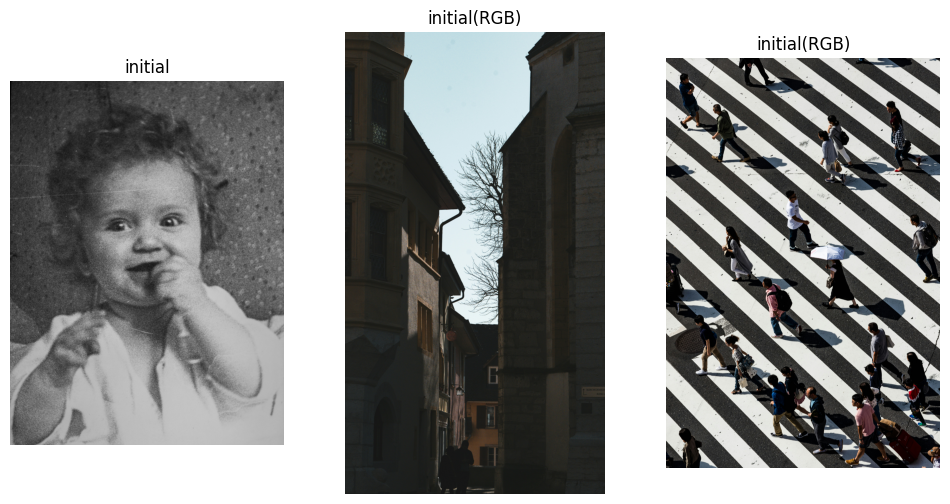

shape1： (5184, 3888, 3)
dtype1： uint8
shape2： (6000, 3376, 3)
dtype2： uint8
shape3： (6016, 4016, 3)
dtype3： uint8


In [97]:
# 读取图像
image1 = cv2.imread('old_photo.jpg')
image2 = cv2.imread('low_contrast.jpg')
image3 = cv2.imread('street_man.jpg')

# 转换为RGB（用于显示）
image_rgb1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image_rgb2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image_rgb3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)
# 显示图像
# 创建一个包含3个子图的figure
fig, axes = plt.subplots(1, 3, figsize=(12, 6))  # 1行3列，每个图大小可调

# 显示第一张图
axes[0].imshow(image_rgb1)
axes[0].axis('off')  # 关闭坐标轴
axes[0].set_title('initial')

# 显示第二张图
axes[1].imshow(image_rgb2)
axes[1].axis('off')
axes[1].set_title('initial(RGB)')

# 显示第三张图
axes[2].imshow(image_rgb3)
axes[2].axis('off')
axes[2].set_title('initial(RGB)')

# 显示整个figure
plt.show()


# 打印图像信息
print("shape1：", image1.shape)
print("dtype1：", image1.dtype)

print("shape2：", image2.shape)
print("dtype2：", image2.dtype)

print("shape3：", image3.shape)
print("dtype3：", image3.dtype)

# 统一尺寸

old_photo.jpg original：(5184, 3888, 3)
low_contrast.jpg original：(6000, 3376, 3)
street_man.jpg original：(6016, 4016, 3)


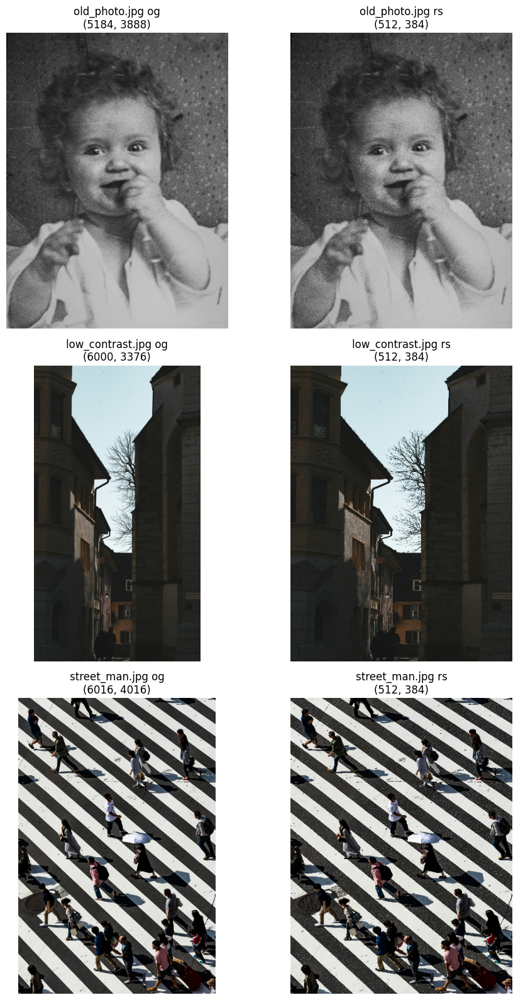

In [24]:
# 定义目标尺寸
target_size = (384, 512)  # (宽度, 高度)

# 图片文件名列表
image_files = ['old_photo.jpg', 'low_contrast.jpg', 'street_man.jpg']

# 存储调整后的图像
resized_images = []

# 读取和调整大小
for file in image_files:
    # 读取图像
    img = cv2.imread(file)
    
    # 记录原始形状
    original_shape = img.shape
    print(f"{file} original：{original_shape}")
    
    # 调整大小
    resized_img = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
    resized_images.append((file, img, resized_img))
    
    # 保存调整后的图像
    output_file = f"resized_{file}"
    cv2.imwrite(output_file, resized_img)
   

# 显示原始和调整后的图像
plt.figure(figsize=(10 ,16))
for i, (file, original, resized) in enumerate(resized_images, 1):
    # 原始图像（转换为RGB）
    plt.subplot(len(resized_images), 2, 2*i-1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f'{file} og\n{original.shape[:2]}')
    
    # 调整后的图像（转换为RGB）
    plt.subplot(len(resized_images), 2, 2*i)
    plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f'{file} rs\n{resized.shape[:2]}')

plt.tight_layout()
plt.show()

# 转换彩色图片为灰度图片

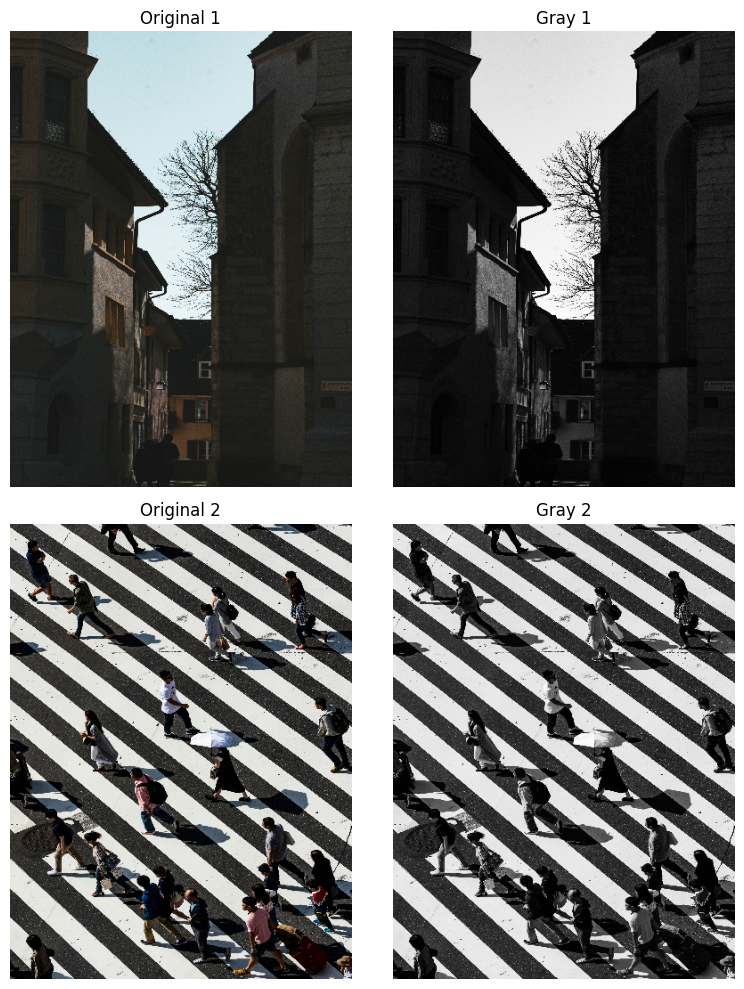

True

In [25]:
resized_img1 = resized_images[0][2]  # 第一张调整后的图像
resized_img2 = resized_images[1][2]  # 第二张调整后的图像
resized_img3 = resized_images[2][2]  # 第三张调整后的图像

# 转换为灰度图像
gray_image2 = cv2.cvtColor(resized_img2, cv2.COLOR_BGR2GRAY)
gray_image3 = cv2.cvtColor(resized_img3, cv2.COLOR_BGR2GRAY)

# 显示灰度图像
fig, axes = plt.subplots(2, 2, figsize=(8, 10))  # 2行2列，每个图大小可调

# 显示原始彩色图像
axes[0][0].imshow(cv2.cvtColor(resized_img2, cv2.COLOR_BGR2RGB))  # 转换为 RGB 显示
axes[0][0].axis('off')
axes[0][0].set_title('Original 1')

axes[1][0].imshow(cv2.cvtColor(resized_img3, cv2.COLOR_BGR2RGB))
axes[1][0].axis('off')
axes[1][0].set_title('Original 2')

# 显示灰度图像
axes[0][1].imshow(gray_image2, cmap='gray')  # 指定灰度色图
axes[0][1].axis('off')
axes[0][1].set_title('Gray 1')

axes[1][1].imshow(gray_image3, cmap='gray')
axes[1][1].axis('off')
axes[1][1].set_title('Gray 2')

plt.tight_layout()
plt.show()

# 保存灰度图像
cv2.imwrite('gray_colorful2.jpg', gray_image2)
cv2.imwrite('gray_colorful3.jpg', gray_image3)


# 对老照片进行去噪滤波/锐化

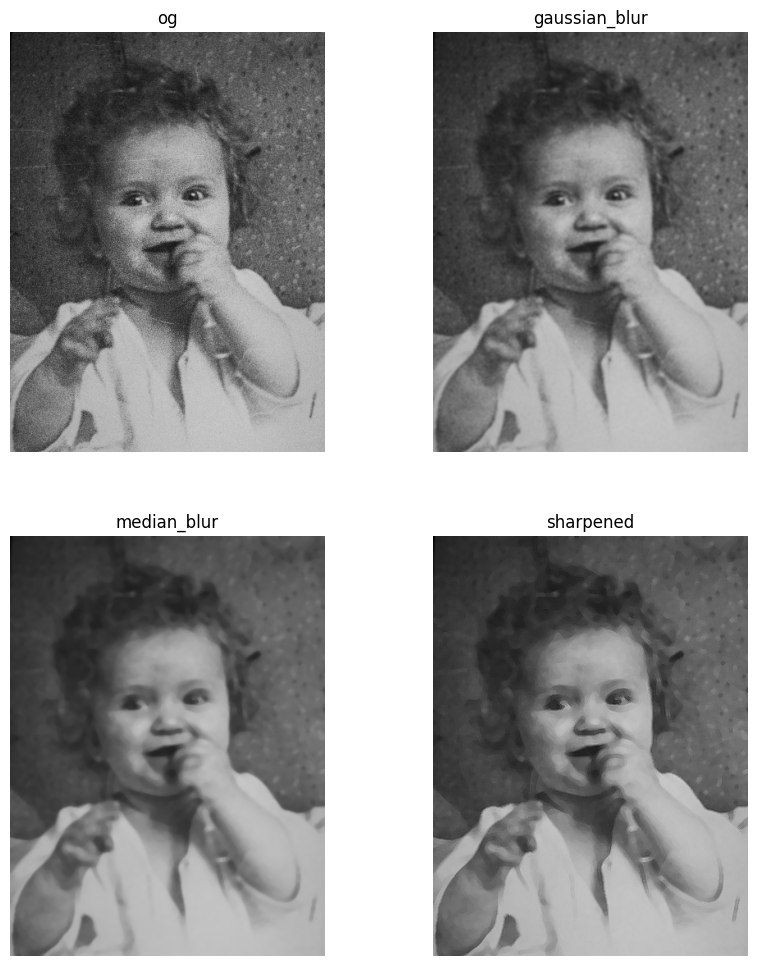

In [57]:
# 读取噪声图像
noisy_image = cv2.imread('resized_old_photo.jpg')

# 高斯滤波
gaussian_blur = cv2.GaussianBlur(noisy_image, (5, 5), 0) #注意里面的高斯核

# 中值滤波
median_blur = cv2.medianBlur(gaussian_blur, 7)
median_blur = cv2.medianBlur(gaussian_blur, 7) #两次


# 锐化（使用拉普拉斯滤波）
kernel = np.array([[0, -1, 0], 
                   [-1, 5, -1], 
                   [0, -1, 0]])  # 锐化核
sharpened = cv2.filter2D(median_blur, -1, kernel)

# 显示对比
plt.figure(figsize=(10,12))
plt.subplot(2, 2, 1)
plt.imshow(noisy_image)
plt.axis('off')
plt.title('og')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(gaussian_blur, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('gaussian_blur')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(median_blur, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('median_blur')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('sharpened')
plt.show()

# 边缘检测

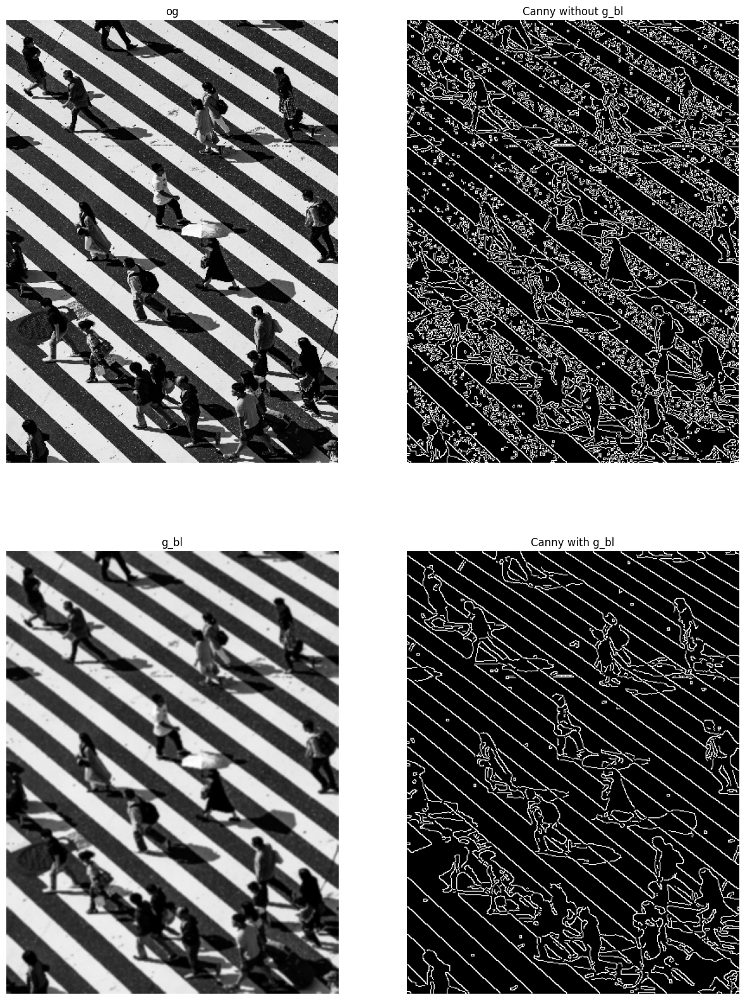

In [80]:
# 读取街道图片
image = cv2.imread('gray_colorful3.jpg', cv2.IMREAD_GRAYSCALE)

# 高斯模糊（减少噪声）
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Canny边缘检测
edges = cv2.Canny(image, 50, 150)

# Canny边缘检测
edges2 = cv2.Canny(blurred, 50, 150)

# 显示对比
plt.figure(figsize=(15, 20))
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('og')

plt.subplot(2, 2, 3)
plt.imshow(blurred, cmap='gray')
plt.axis('off')
plt.title('g_bl')

plt.subplot(2, 2, 2)
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.title('Canny without g_bl')

plt.subplot(2, 2, 4)
plt.imshow(edges2, cmap='gray')
plt.axis('off')
plt.title('Canny with g_bl')
plt.show()

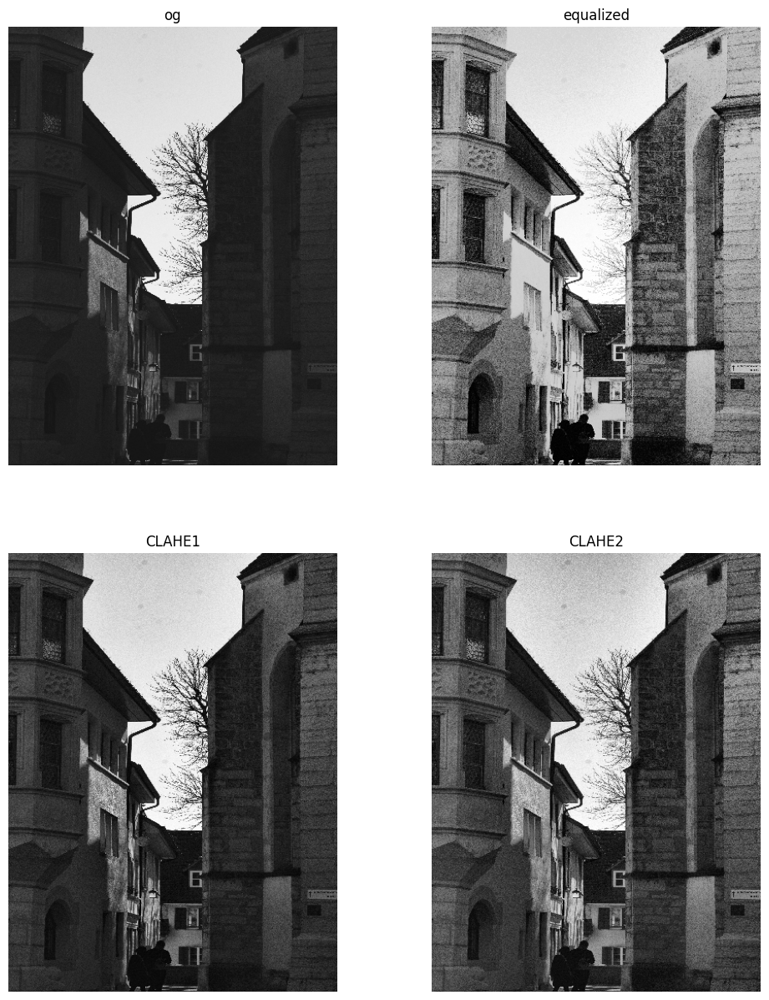

In [96]:
# 直方图均衡化
equalized = cv2.equalizeHist(gray_image2)

# CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(gray_image2)

clahe2 = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(6, 6))
clahe_image2 = clahe2.apply(gray_image2)

# 显示对比
plt.figure(figsize=(12, 15))
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(gray_image2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('og')

plt.subplot(2, 2, 2)
plt.imshow(equalized, cmap='gray')
plt.axis('off')
plt.title('equalized')

plt.subplot(2, 2, 3)
plt.imshow(clahe_image, cmap='gray')
plt.axis('off')
plt.title('CLAHE1')

plt.subplot(2, 2, 4)
plt.imshow(clahe_image2, cmap='gray')
plt.axis('off')
plt.title('CLAHE2')
plt.show()

# 变换操作

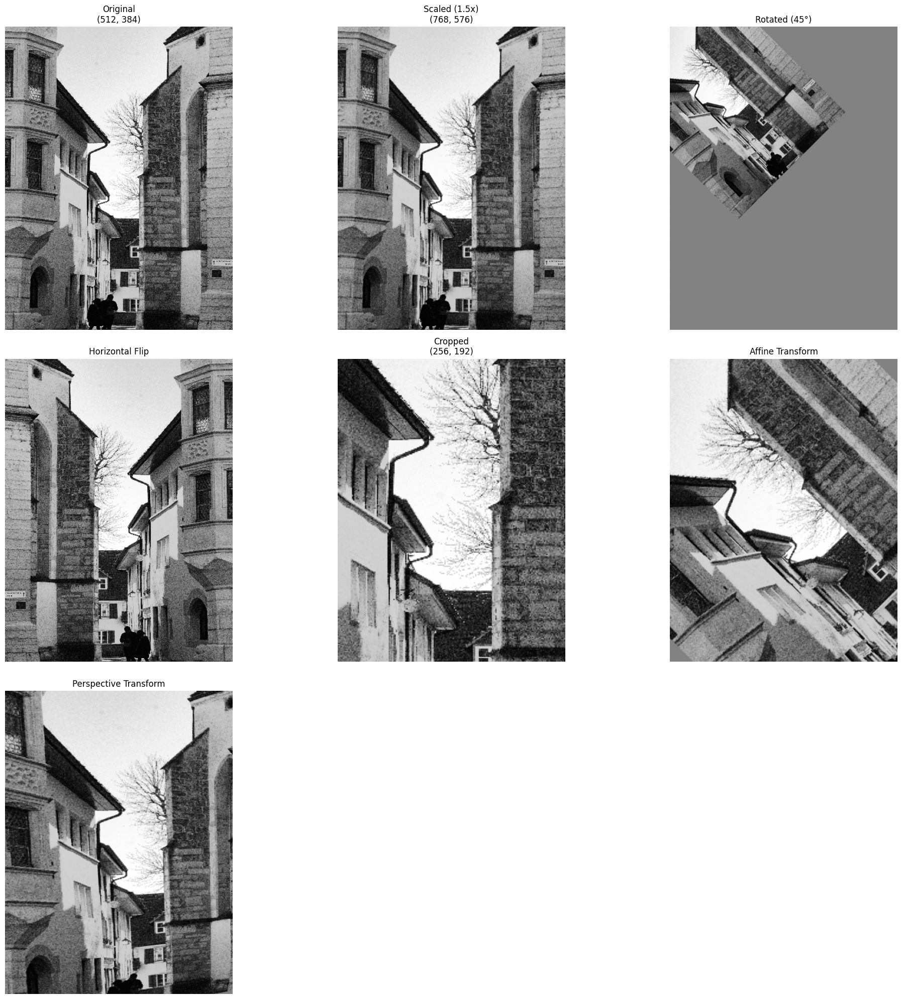

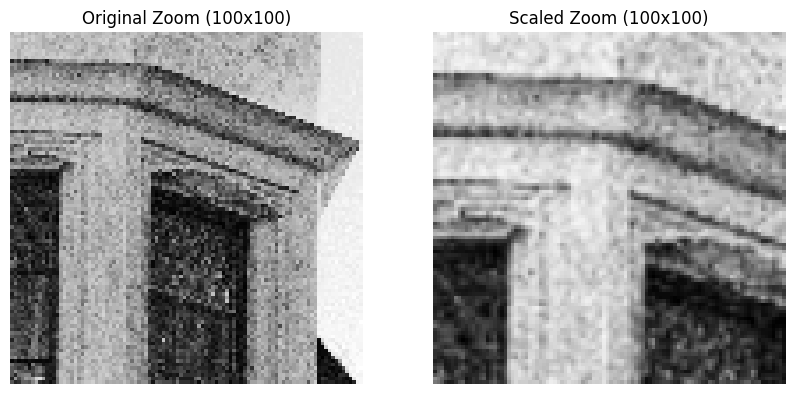

In [107]:
# 获取图像尺寸
h, w = equalized.shape

# 计算均值用于填充
border_value = int(np.mean(equalized))

# 1. 缩放（放大1.5倍）
scale_factor = 1.5
scaled = cv2.resize(equalized, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
cv2.imwrite('scaled_equalized.jpg', scaled)

#显示时由于matplotlib，看起来一样）但实际上放大了

# 2. 旋转（顺时针45度）
center = (w // 2, h // 2)
scale = 1.5  # 放大以避免裁剪
M_rot = cv2.getRotationMatrix2D(center, 45, scale)
new_w, new_h = int(w * scale * 1.5), int(h * scale * 1.5)
rotated = cv2.warpAffine(equalized, M_rot, (new_w, new_h), borderMode=cv2.BORDER_CONSTANT, borderValue=border_value)
cv2.imwrite('rotated_equalized.jpg', rotated)

# 3. 翻转（水平翻转）
flipped = cv2.flip(equalized, 1)
cv2.imwrite('flipped_equalized.jpg', flipped)

# 4. 裁剪（取中间区域）
crop_h, crop_w = h // 2, w // 2
crop_y, crop_x = h // 4, w // 4
cropped = equalized[crop_y:crop_y+crop_h, crop_x:crop_x+crop_w]
cv2.imwrite('cropped_equalized.jpg', cropped)

# 5. 仿射变换（平移+倾斜）
pts1 = np.float32([[50, 50], [w-50, 50], [50, h-50]])
pts2 = np.float32([[100, 100], [w, 50], [50, h]])
M_affine = cv2.getAffineTransform(pts1, pts2)
affine = cv2.warpAffine(equalized, M_rot, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=border_value)
cv2.imwrite('affine_equalized.jpg', affine)

# 6. 透视变换
pts1 = np.float32([[50, 50], [w-50, 50], [50, h-50], [w-50, h-50]])
pts2 = np.float32([[0, 0], [w, 50], [50, h], [w, h-50]])
M_perspective = cv2.getPerspectiveTransform(pts1, pts2)
perspective = cv2.warpPerspective(equalized, M_perspective, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=border_value)
cv2.imwrite('perspective_equalized.jpg', perspective)

# 显示对比（整体图像）
plt.figure(figsize=(20, 20))

plt.subplot(3, 3, 1)
plt.imshow(equalized, cmap='gray')
plt.axis('off')
plt.title(f'Original\n{equalized.shape}')

plt.subplot(3, 3, 2)
plt.imshow(scaled, cmap='gray')
plt.axis('off')
plt.title(f'Scaled (1.5x)\n{scaled.shape}')

plt.subplot(3, 3, 3)
plt.imshow(rotated, cmap='gray')
plt.axis('off')
plt.title('Rotated (45°)')

plt.subplot(3, 3, 4)
plt.imshow(flipped, cmap='gray')
plt.axis('off')
plt.title('Horizontal Flip')

plt.subplot(3, 3, 5)
plt.imshow(cropped, cmap='gray')
plt.axis('off')
plt.title(f'Cropped\n{cropped.shape}')

plt.subplot(3, 3, 6)
plt.imshow(affine, cmap='gray')
plt.axis('off')
plt.title('Affine Transform')

plt.subplot(3, 3, 7)
plt.imshow(perspective, cmap='gray')
plt.axis('off')
plt.title('Perspective Transform')

plt.tight_layout()
plt.show()

# 显示缩放细节（局部放大）
zoom_size = 100  # 放大区域大小
zoom_original = equalized[:zoom_size, :zoom_size]  # 原图左上角
zoom_scaled = scaled[:zoom_size, :zoom_size]  # 缩放图左上角

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(zoom_original, cmap='gray')
plt.axis('off')
plt.title(f'Original Zoom (100x100)')

plt.subplot(1, 2, 2)
plt.imshow(zoom_scaled, cmap='gray')
plt.axis('off')
plt.title(f'Scaled Zoom (100x100)')
plt.show()